In [136]:
from scipy.stats import median_abs_deviation

import sys
sys.path.insert(0, '/home/workspace/mm_analysis')
sys.path.insert(0, '/home/workspace/')

from py_util import *
from utilities import *

hdir = '/home/workspace'
wdir = hdir + "/mm_analysis/EXP-01244"
objdir1 = wdir + "/processing/objects/"
objdir2 = wdir + "/annotations/objects/"
degdir = wdir + "/deg_list/"

adata = sc.read_h5ad(objdir1 + "ds_processed_all_organoids_adata.h5ad")

adata_type = "All Organoids (downsampled)"

l1 = {cluster: cluster for cluster in sorted(adata.obs['leiden_0_3'].unique(), key=int)}

# UMAPs

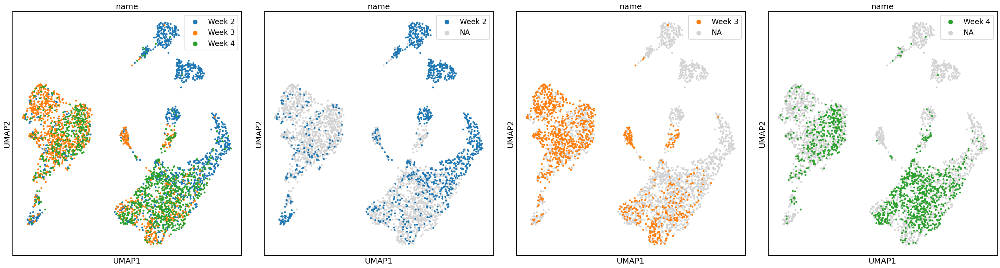

In [81]:
fig, ax, idx = subplot_grids(4, aspect_ratio=4, gridspec_kw={'wspace': 0.1})

for i in idx:
    sc.pl.umap(
        adata,
        color='name',
        groups='Week 2' if i == idx[1] else ('Week 3' if i == idx[2] else ('Week 4' if i == idx[3] else None)),
        show=False,
        ax=ax[i],
        legend_loc='best',
        size=75
    )

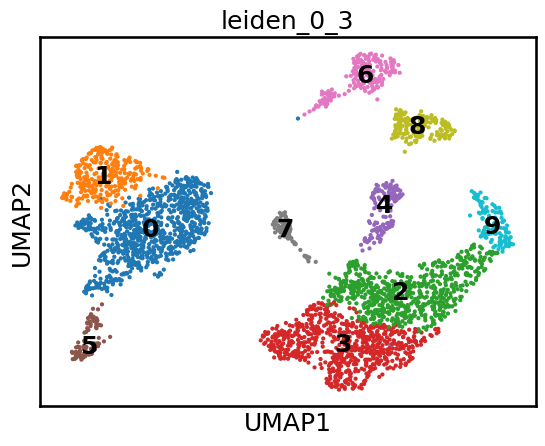

In [140]:
sc.pl.umap(
    adata,
    color='leiden_0_3',
    legend_loc='on data'
)

Text(0.5, 0.91, 'All Organoids (downsampled): Leiden Resolutions')

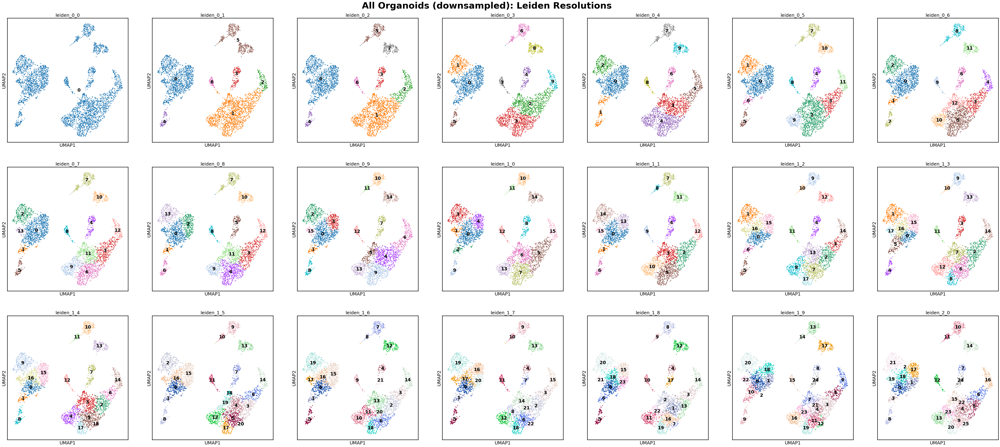

In [82]:
colors = list(adata.uns['leiden_ranges'])

fig, ax, idx = subplot_grids(len(colors), aspect_ratio=2)

for i, color in zip(idx, colors):
    sc.pl.umap(
        adata,
        color=color,
        show=False,
        ax=ax[i],
        legend_loc='on data'
    )
    
fig.suptitle(f'{adata_type}: Leiden Resolutions', y=.91, fontweight='bold', fontsize=35)

# DEG's

In [168]:
sc.tl.rank_genes_groups(
    adata,
    groupby='leiden_0_3',
    method='wilcoxon',
    n_genes=40,
    key_added='ranke_genes_groups_l1'
)

ranking = adata.uns['ranke_genes_groups_l1']
gene_names = ranking['names']
gene_z_scores = ranking['scores']
gene_logfold = ranking['logfoldchanges']
gene_pvals_adj = ranking['pvals_adj']
clusters = gene_names.dtype.names

df_de_genes = pd.DataFrame()

for cluster in clusters:
    names = gene_names[cluster]
    logfold = gene_logfold[cluster]
    z_scores = gene_z_scores[cluster]
    pvals_adj = gene_pvals_adj[cluster]

    # All genes 
    cluster_df = pd.DataFrame({
        f'C{cluster}_names': names,
        f'C{cluster}_logfold': logfold,
        f'C{cluster}_pvals_adj': pvals_adj,
        f'C{cluster}_z_score': z_scores
    })

    if df_de_genes.empty:
        df_de_genes = cluster_df
    else:
        df_de_genes = pd.merge(df_de_genes, cluster_df, left_index=True, right_index=True, how='outer')

# df_de_genes.to_csv(degdir + 'adjusted_ds_l1_all_organoids_DEGs.csv', index=False)

# Clusters (4, 6, 8): granulocyte-macrophage progenitors (GMP's)

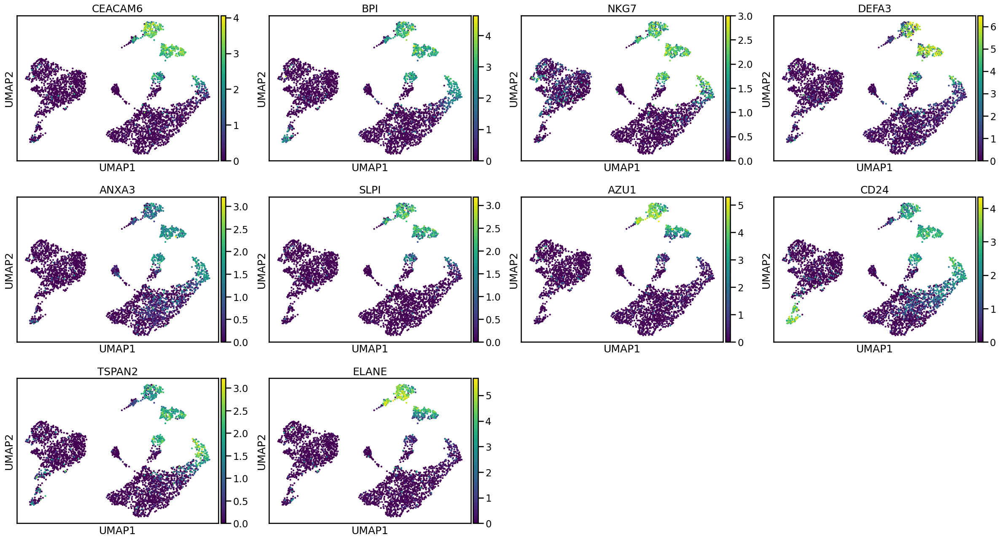

In [41]:
cl8_markers = ['CEACAM6', 'BPI', 'NKG7', 'DEFA3', 'ANXA3', 'SLPI', 'AZU1', 'CD24', 'TSPAN2', 'ELANE']

sc.pl.umap(
    adata,
    color=cl8_markers
)

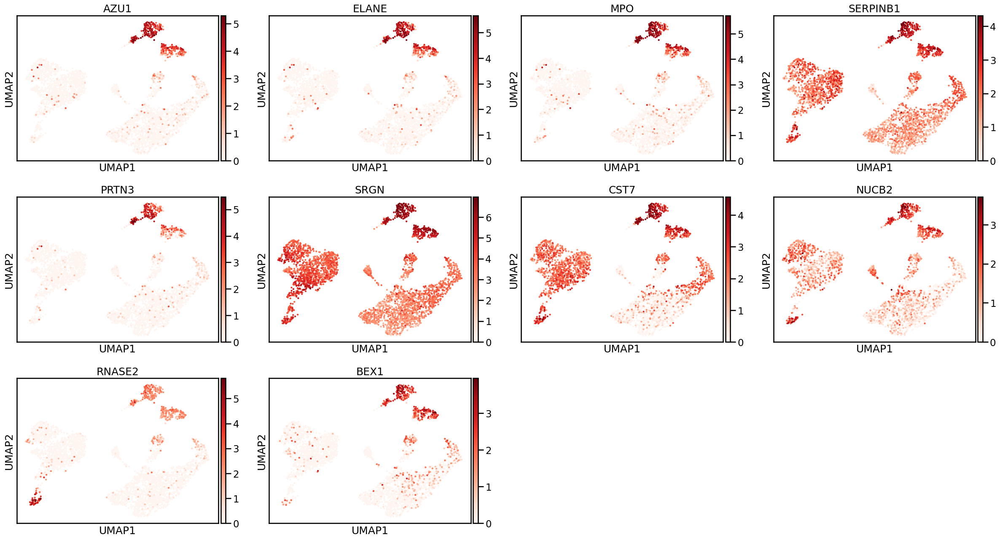

In [146]:
cl6_markers = ['AZU1', 'ELANE', 'MPO', 'SERPINB1', 'PRTN3', 'SRGN', 'CST7', 'NUCB2', 'RNASE2', 'BEX1']

# AZU1,ELANE,MPO,SERPINB1,PRTN3,SRGN,CST7,NUCB2,RNASE2,BEX1

sc.pl.umap(
    adata,
    color=cl6_markers,
    cmap='Reds'
)

In [ ]:
cluster = 'C4'

z_col = [col for col in df_de_genes.columns if cluster in col and 'z_score' in col][0]
names_col = [col for col in df_de_genes.columns if cluster in col and 'names' in col][0]

top10_genes = df_de_genes.nlargest(20, z_col)[names_col]

gene_string = ','.join(top10_genes)
print(gene_string)

In [ ]:
sc.pl.umap(
    adata,
    color=top10_genes,
    cmap='Reds'
)

In [172]:
l1 = {cluster: cluster for cluster in sorted(adata.obs['leiden_0_3'].unique(), key=int)}

celltype = 'GMP'

l1['6'] = celltype
l1['8'] = celltype
l1['4'] = celltype

# Cluster 7: Endothelial (Potentially HUVEC's derived)

In [135]:
cluster = 'C7'

z_col = [col for col in df_de_genes.columns if cluster in col and 'z_score' in col][0]
names_col = [col for col in df_de_genes.columns if cluster in col and 'names' in col][0]

top10_genes = df_de_genes.nlargest(20, c7_z_col)[c7_names_col]

gene_string = ', '.join(top10_genes)
print(gene_string)

SERPINE1, TPM1, CALD1, PRSS23, PXDN, MMP1, DKK3, FSTL1, RCN1, EFEMP1, COL5A1, PODXL, ECE1, SPARC, TXNDC5, GNG11, HHIP, CDH5, FN1, S100A16


In [138]:
l1['7'] = 'endo'

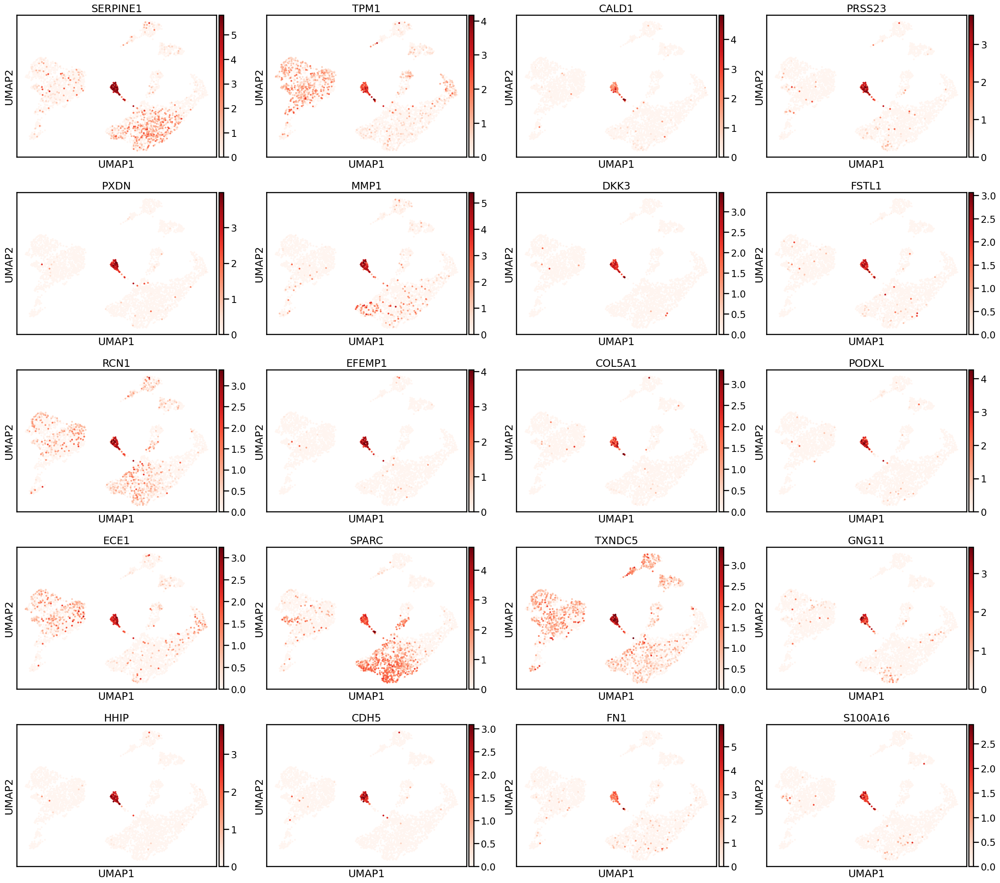

In [128]:
sc.pl.umap(
    adata,
    color=top10_genes,
    cmap='Reds'
)

# Clusters (0, 1): megakaryocyte-erythrocyte progenitors (MEPs)

## DEG's (cl1 vs cl0)

In [157]:
# Clusters 1 and 0 share a lot of the same DEG's

mask = (adata.obs['leiden_0_3'] == '0') | (adata.obs['leiden_0_3'] == '1')
cl0_1 = adata[mask].copy()

sc.tl.rank_genes_groups(
    cl0_1,
    groupby='leiden_0_3',
    method='wilcoxon',
    n_genes=40,
    key_added='ranke_genes_groups_cl0_1'
)

ranking = cl0_1.uns['ranke_genes_groups_cl0_1']
gene_names = ranking['names']
gene_z_scores = ranking['scores']
gene_logfold = ranking['logfoldchanges']
gene_pvals_adj = ranking['pvals_adj']
clusters = gene_names.dtype.names

df_de_genes = pd.DataFrame()

for cluster in clusters:
    names = gene_names[cluster]
    logfold = gene_logfold[cluster]
    z_scores = gene_z_scores[cluster]
    pvals_adj = gene_pvals_adj[cluster]

    # All genes 
    cluster_df = pd.DataFrame({
        f'C{cluster}_names': names,
        f'C{cluster}_logfold': logfold,
        f'C{cluster}_pvals_adj': pvals_adj,
        f'C{cluster}_z_score': z_scores
    })

    if df_de_genes.empty:
        df_de_genes = cluster_df
    else:
        df_de_genes = pd.merge(df_de_genes, cluster_df, left_index=True, right_index=True, how='outer')

In [166]:
cluster = "C1"

z_col = [col for col in df_de_genes.columns if cluster in col and 'z_score' in col][0]
names_col = [col for col in df_de_genes.columns if cluster in col and 'names' in col][0]

top10_genes = df_de_genes.nlargest(20, z_col)[names_col]

gene_string = ','.join(top10_genes)
print(gene_string)

MKI67,TYMS,RRM2,TUBA1B,TUBB,CDK1,HIST1H1B,TPX2,ZWINT,CKS1B,HIST1H2BH,LMNB1,CKAP2L,TK1,TACC3,FOXM1,NUSAP1,CENPH,HMGB2,IDH2


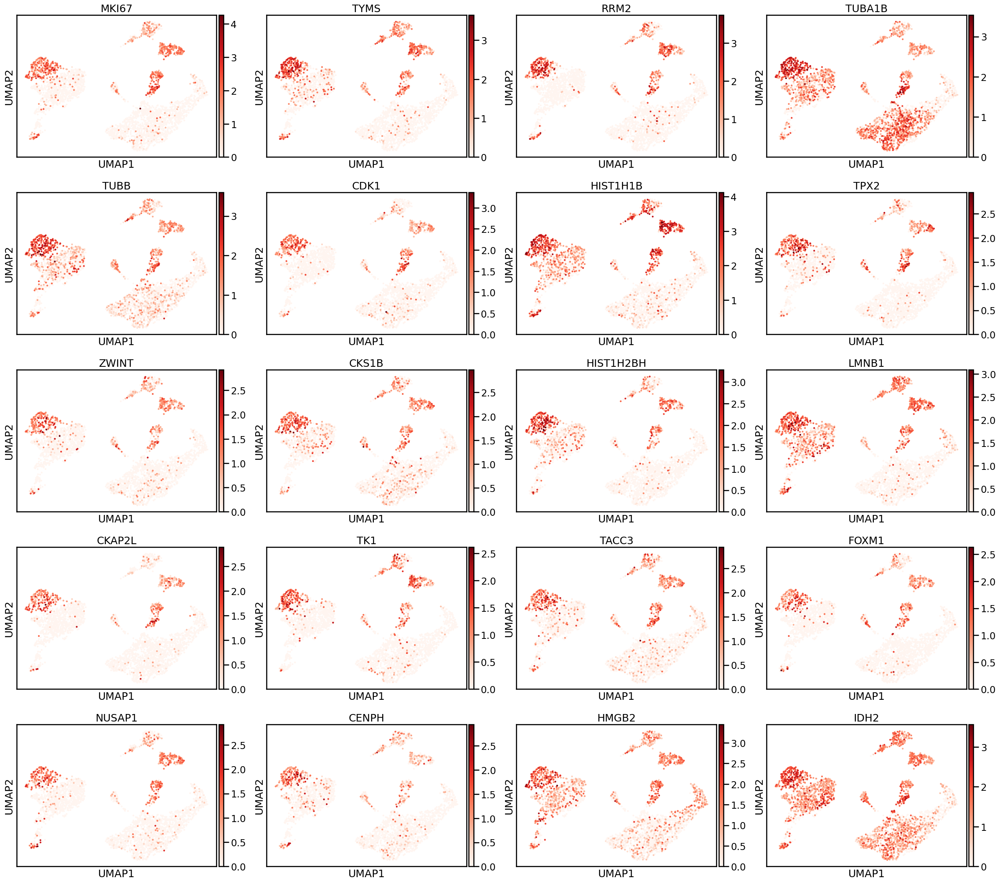

In [163]:
sc.pl.umap(
    adata,
    color=top10_genes,
    cmap='Reds'
)

## DEG's cl0

In [170]:
cluster = "C0"

z_col = [col for col in df_de_genes.columns if cluster in col and 'z_score' in col][0]
names_col = [col for col in df_de_genes.columns if cluster in col and 'names' in col][0]

top10_genes = df_de_genes.nlargest(20, z_col)[names_col]

gene_string = ', '.join(top10_genes)
print(gene_string)

GATA2, CPA3, SIGLEC6, LAPTM5, CLU, SAMSN1, FXYD5, HDC, SEMA7A, HPGD, MS4A2, AHR, KIT, VWA5A, ITGA2B, IL1RL1, GCSAML, FCER1A, HPGDS, RASSF5


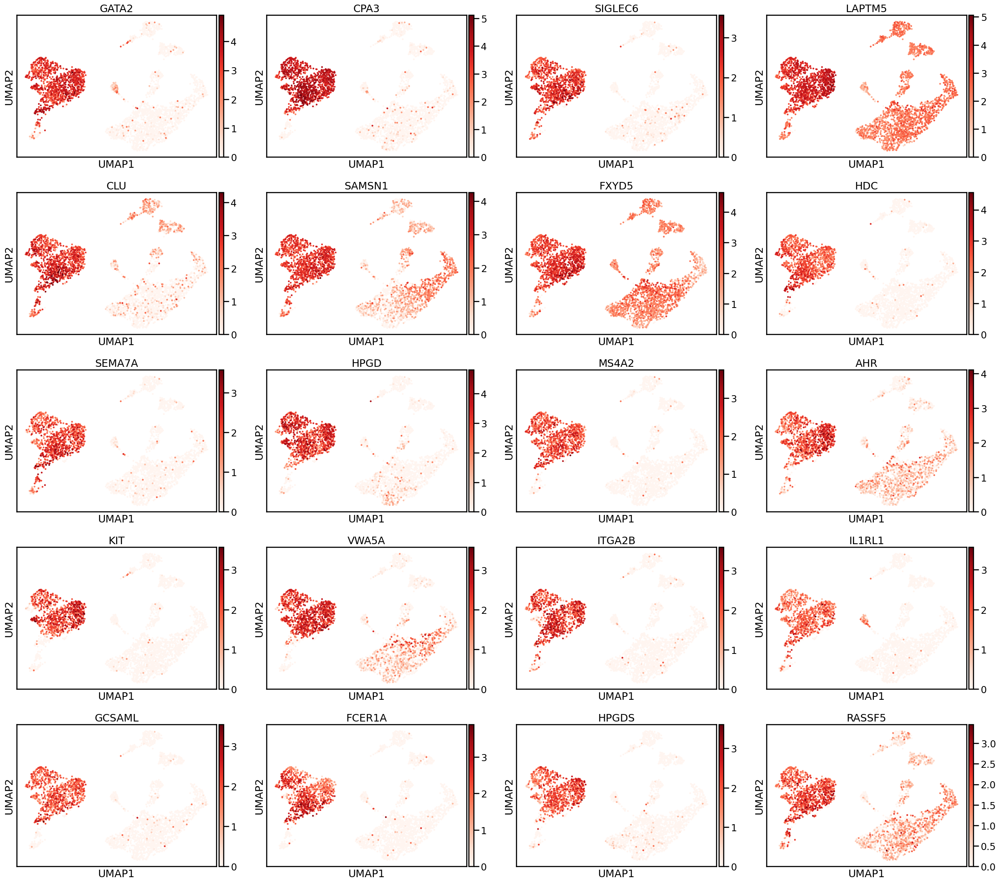

In [171]:
sc.pl.umap(
    adata,
    color=top10_genes,
    cmap='Reds'
)

# Cluster 5

In [176]:
cluster = "C5"

z_col = [col for col in df_de_genes.columns if cluster in col and 'z_score' in col][0]
names_col = [col for col in df_de_genes.columns if cluster in col and 'names' in col][0]

top10_genes = df_de_genes.nlargest(40, z_col)[names_col]

gene_string = ','.join(top10_genes)
print(gene_string)

CLC,CD24,TMSB4X,EPX,PRG2,RNASE2,ALAS1,IKZF2,CST7,PRG3,CORO1A,SYNE1,CEBPE,STXBP5,PYGL,ENTPD1,CD63,PLPP1,SRGN,ADGRG3,CCL23,EGR3,NCF4,PGD,CD96,FOS,ADAM8,PSTPIP2,KLF10,CKAP4,SERPINB1,FTL,EBP,FGD4,ARL4C,MYADM,S100A8,RAB11FIP1,NCF2,FRY


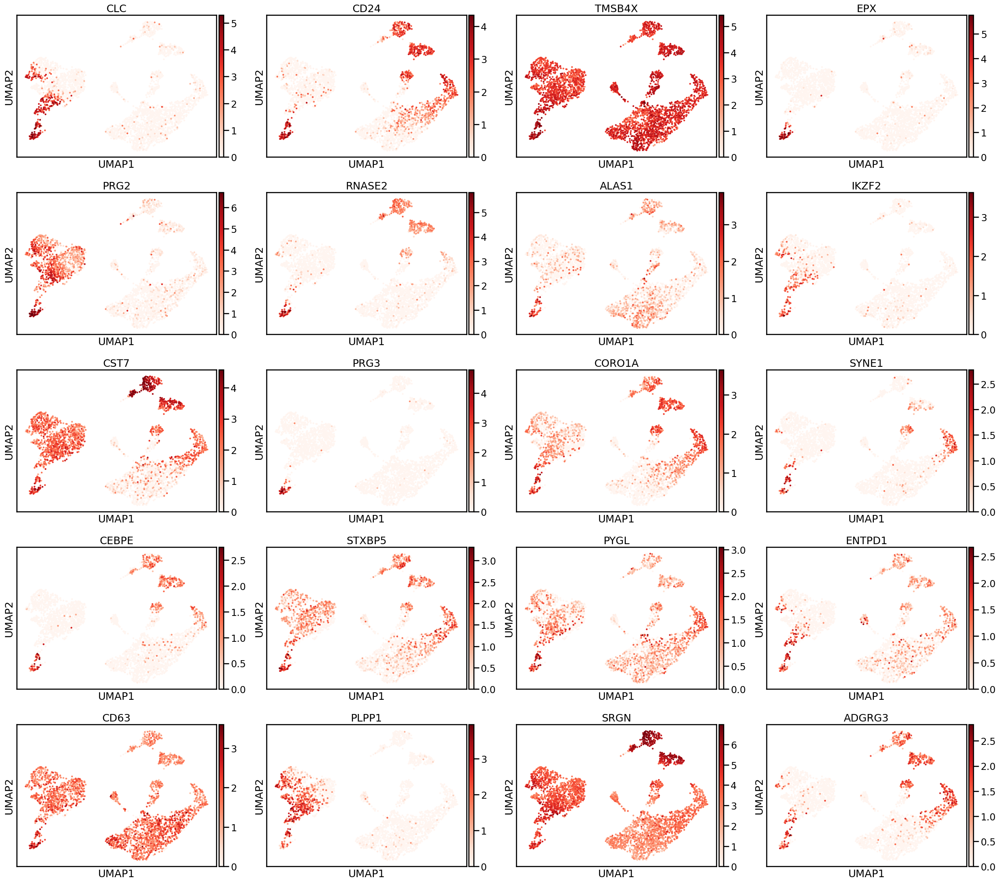

In [174]:
sc.pl.umap(
    adata,
    color=top10_genes,
    cmap='Reds'
)

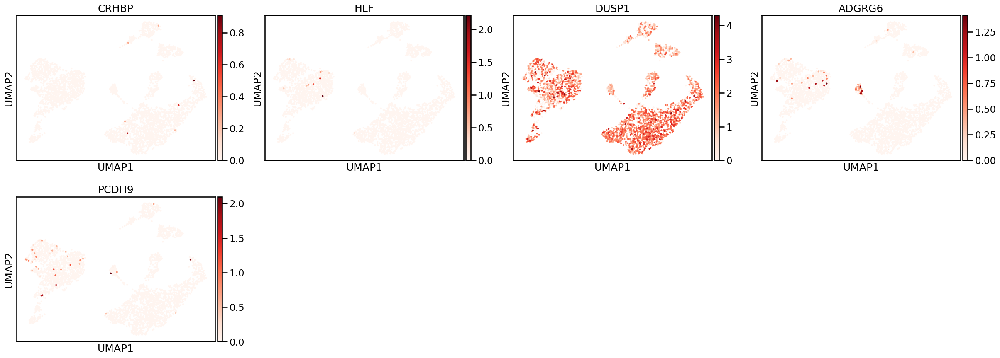

In [178]:
sc.pl.umap(
    adata,
    color=['CRHBP', 'HLF', 'DUSP1', 'ADGRG6', 'PCDH9'],
    cmap='Reds'
)